<a href="https://colab.research.google.com/github/shakil55/project/blob/main/Image_Classification_cat%26dog.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Download Data Set

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2023-05-14 00:05:50--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 184.51.99.68, 2600:1413:1:597::317f, 2600:1413:1:5a0::317f
Connecting to download.microsoft.com (download.microsoft.com)|184.51.99.68|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M   135MB/s    in 7.0s    

2023-05-14 00:05:57 (112 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



## Unzip the dataset



In [ ]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

In [ ]:
!ls

sample_data


In [ ]:
!pip install keras


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Import the module


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from tensorflow.keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

## Create Dataframe for Input and Output


In [ ]:
input_path = []
label = []

for class_name in os.listdir("PetImages"):
    for path in os.listdir("PetImages/"+class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("PetImages", class_name, path))
print(input_path[0], label[0])

PetImages/Cat/6026.jpg 0


## create the dataframe for processing

In [ ]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Cat/9100.jpg,0
1,PetImages/Cat/9144.jpg,0
2,PetImages/Dog/8969.jpg,1
3,PetImages/Dog/7088.jpg,1
4,PetImages/Cat/5899.jpg,0


## Remove non image data

In [ ]:
for i in df['images']:
    if '.jpg' not in i:
        print(i)

PetImages/Dog/Thumbs.db
PetImages/Cat/Thumbs.db


In [ ]:
import PIL
l = []
for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)
l

['PetImages/Dog/Thumbs.db',
 'PetImages/Dog/11702.jpg',
 'PetImages/Cat/666.jpg',
 'PetImages/Cat/Thumbs.db']

## Delete Non Image data

In [ ]:
df = df[df['images']!='PetImages/Dog/Thumbs.db']
df = df[df['images']!='PetImages/Cat/Thumbs.db']
df = df[df['images']!='PetImages/Cat/666.jpg']
df = df[df['images']!='PetImages/Dog/11702.jpg']
len(df)

24998

## Exploratory Data Analysis

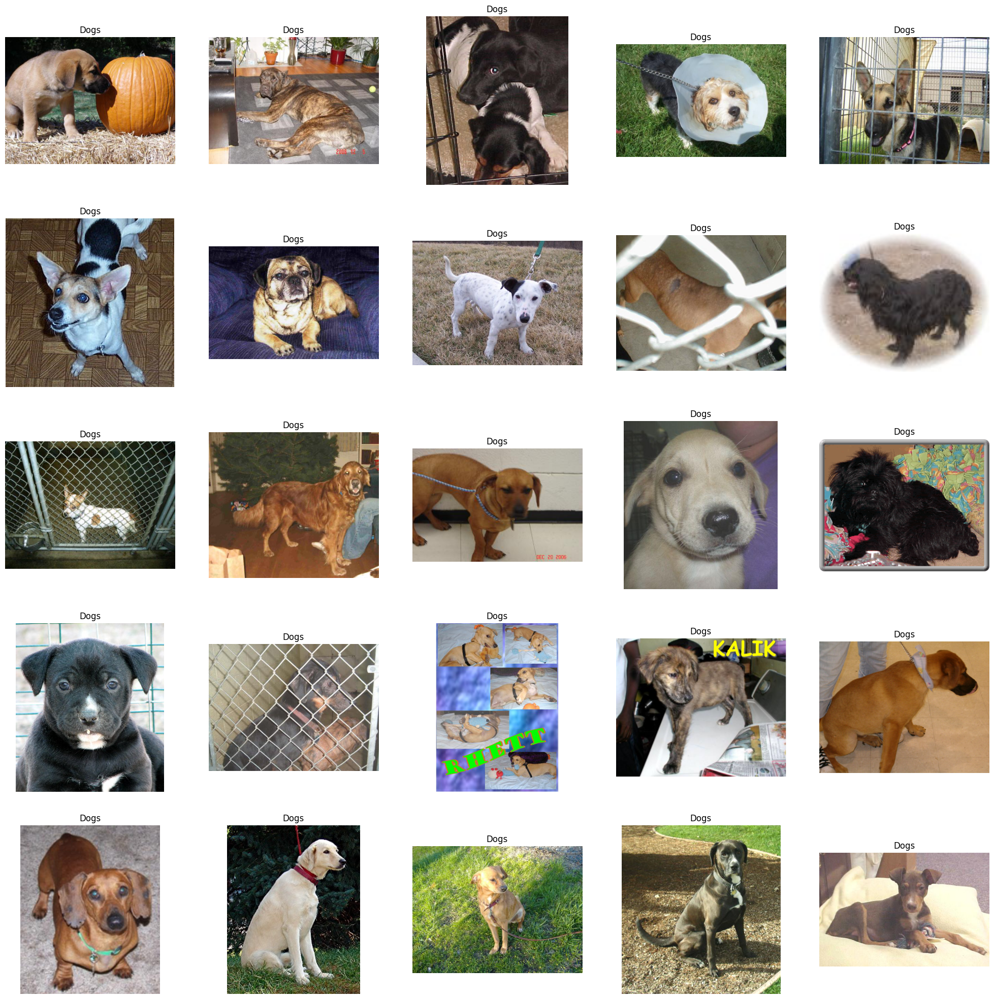

In [ ]:
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

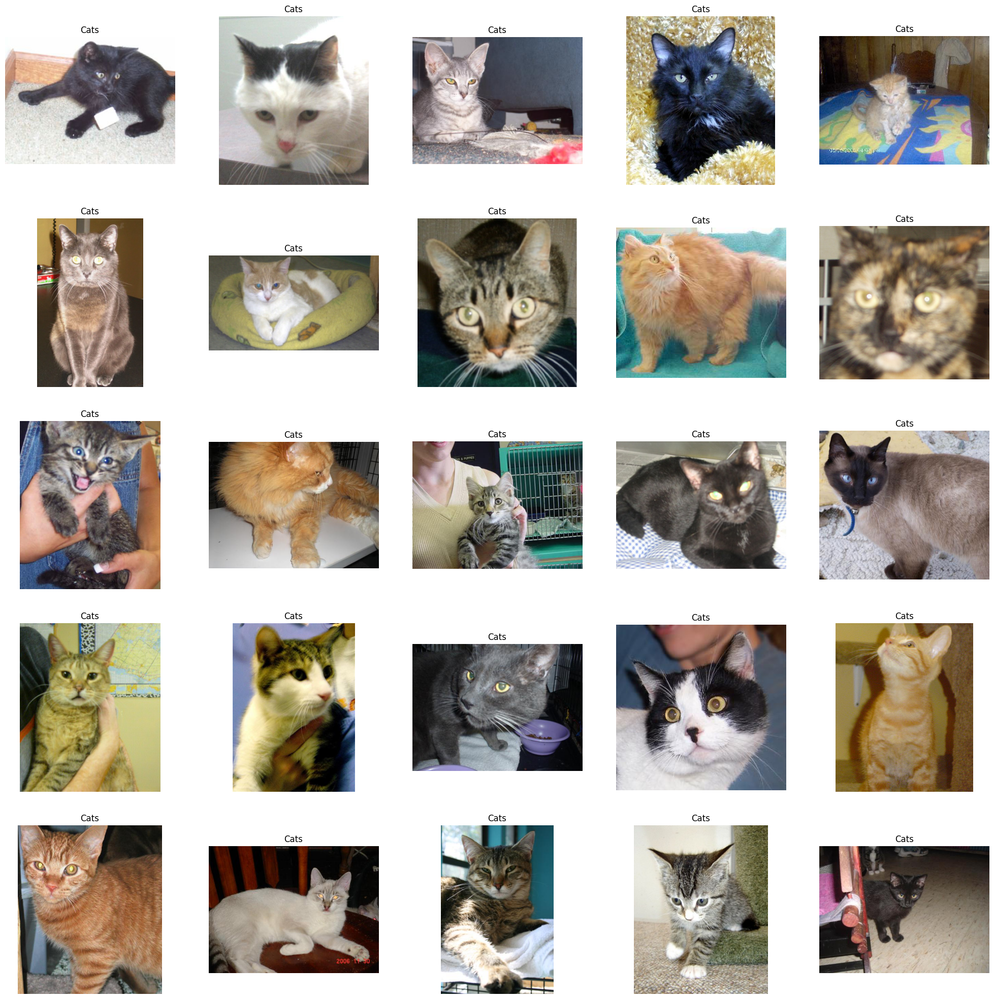

In [ ]:
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

##Create Data Generator for the Images

In [ ]:
df['label'] = df['label'].astype('str')
df.head()

,images,label
0,PetImages/Cat/9100.jpg,0
1,PetImages/Cat/9144.jpg,0
2,PetImages/Dog/8969.jpg,1
3,PetImages/Dog/7088.jpg,1
4,PetImages/Cat/5899.jpg,0


## split the input data

In [ ]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)



from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255,  # normalization of images
    rotation_range = 40, # augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test,x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


## Model Creation

In [ ]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

model = Sequential([
            Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
            MaxPool2D((2,2)),
            Conv2D(32, (3,3), activation='relu'),
            MaxPool2D((2,2)),
            Conv2D(64, (3,3), activation='relu'),
            MaxPool2D((2,2)),
            Flatten(),
            Dense(512, activation='relu'),
            Dense(1, activation='sigmoid')
])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 64)       0

## Plot Model

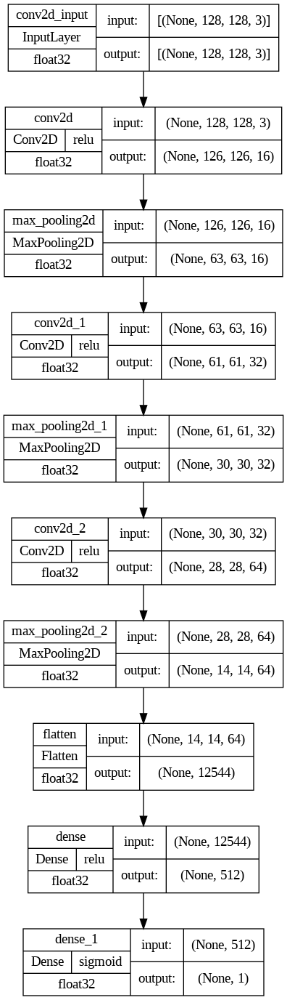

In [ ]:
import tensorflow.keras as keras
keras.utils.plot_model(
    model,
    show_shapes=True,
    show_dtype=True,
    show_layer_activations=True
)

## Train data

In [ ]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

Epoch 1/10
40/40 [==============================] - 160s 4s/step - loss: 0.7181 - accuracy: 0.5409 - val_loss: 0.6401 - val_accuracy: 0.6248
Epoch 2/10
40/40 [==============================] - 143s 4s/step - loss: 0.6200 - accuracy: 0.6516 - val_loss: 0.5896 - val_accuracy: 0.6878
Epoch 3/10
40/40 [==============================] - 147s 4s/step - loss: 0.5768 - accuracy: 0.6981 - val_loss: 0.5531 - val_accuracy: 0.7134
Epoch 4/10
40/40 [==============================] - 142s 4s/step - loss: 0.5611 - accuracy: 0.7082 - val_loss: 0.5324 - val_accuracy: 0.7344
Epoch 5/10
40/40 [==============================] - 144s 4s/step - loss: 0.5212 - accuracy: 0.7397 - val_loss: 0.4977 - val_accuracy: 0.7542
Epoch 6/10
40/40 [==============================] - 142s 4s/step - loss: 0.4972 - accuracy: 0.7582 - val_loss: 0.4844 - val_accuracy: 0.7680
Epoch 7/10
40/40 [==============================] - 150s 4s/step - loss: 0.4881 - accuracy: 0.7643 - val_loss: 0.4807 - val_accuracy: 0.7732
Epoch 8/10
40

In [ ]:
model.save("model1_catsVSdogs_10epoch.h5")

## Visualization of Results

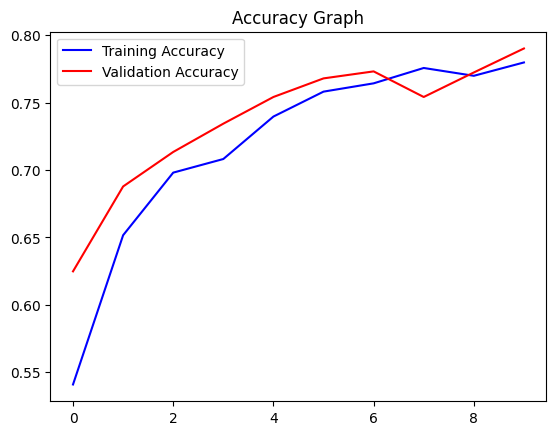

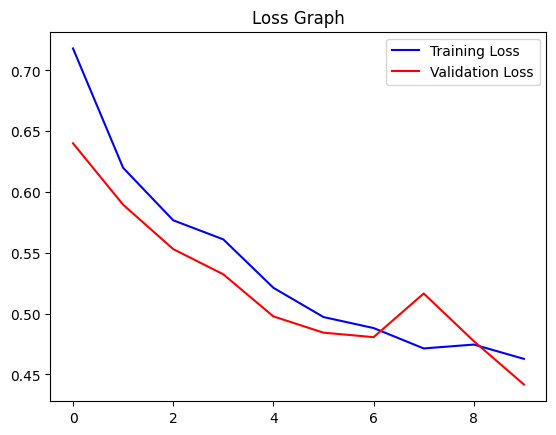

In [ ]:

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

## Test with Real Image

In [ ]:
image_path = "/content/drive/MyDrive/Colab Notebooks/dog1.jpg" # path of the image
img = load_img(image_path, target_size=(128, 128))
img = np.array(img)
img = img / 255.0 # normalize the image
img = img.reshape(1, 128, 128, 3) # reshape for prediction
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(label)

1/1 [==============================] - 0s 184ms/step
Dog


1/1 [==============================] - 0s 28ms/step


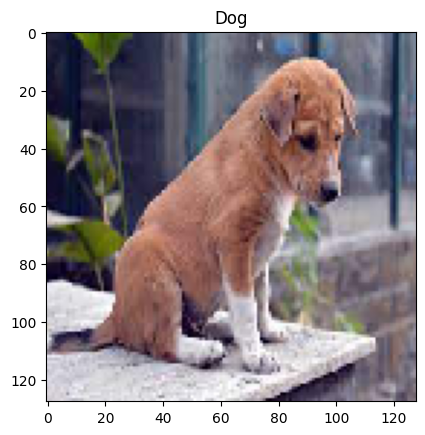

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.image import load_img
import matplotlib.pyplot as plt

# Load the image
image_path = "/content/drive/MyDrive/Colab Notebooks/dog1.jpg"
img = load_img(image_path, target_size=(128, 128))

# Convert the image to a numpy array and normalize it
img = np.array(img) / 255.0

# Reshape the image for prediction
img = img.reshape(1, 128, 128, 3)

# Make a prediction
pred = model.predict(img)

# Determine the label based on the prediction
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'

# Display the image
plt.imshow(img[0])
plt.title(label)
plt.show()

1/1 [==============================] - 0s 21ms/step


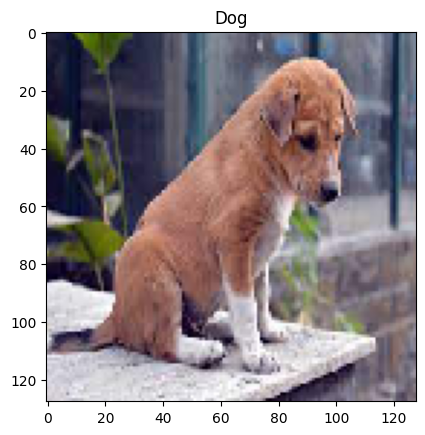

1/1 [==============================] - 0s 17ms/step


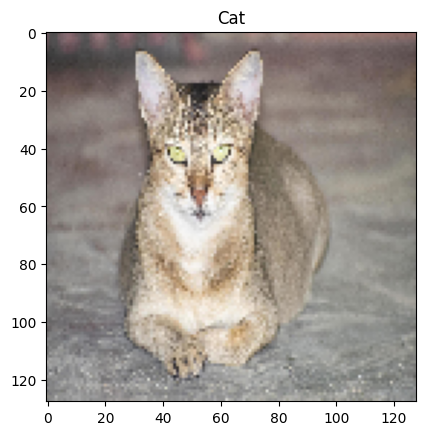

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.image import load_img
import matplotlib.pyplot as plt

def predict_label(image_path):
    # Load the image
    img = load_img(image_path, target_size=(128, 128))

    # Convert the image to a numpy array and normalize it
    img = np.array(img) / 255.0

    # Reshape the image for prediction
    img = img.reshape(1, 128, 128, 3)

    # Make a prediction
    pred = model.predict(img)

    # Determine the label based on the prediction
    if pred[0] > 0.5:
        label = 'Dog'
    else:
        label = 'Cat'

    return label

# Process multiple images
image_paths = ["/content/drive/MyDrive/Colab Notebooks/dog1.jpg",
               '/content/drive/MyDrive/Colab Notebooks/abyssinian-cat-in-bangladesh-free-photo.jpg']

for path in image_paths:
    label = predict_label(path)
    img = load_img(path, target_size=(128, 128))
    plt.imshow(img)
    plt.title(label)
    plt.show()